## Maryland Vehicle Crashes Analysis using PySpark

- Maryland Vehicle Crashes Analysis for year 2020, the info is correct as of the time it was created. Only approved crash reports have been included. Data set includes Vehicle Crash Details, Person Details, Vehicle Details.
- Maryland has nearly six million residents and a number of major cities and metropolitan areas. Because of the dense population, a large number of vehicles travel Maryland roads every day, which increases the risk of auto accidents and serious injuries. Thousands of people are injured in car accidents in Maryland each year, according to statistics. Because of these crashes, many victims have significant financial difficulties.
- In this project we have analysed, what are the mojor factors of crashes.

### About data:
Maryland Statewide Vehicle Crashes - Crash Details  
- It contains the data of crashes that take place.  
Data:  
https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes/65du-s3qu/data  
Size: 300 MB  
Maryland Statewide Vehicle Crashes - Person Details (Anonymized)  
- It contains the data of persons that were involved in crashes.  
Data:  
https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes-Person-Details-/py4c-dicf/data  
Size: 476 MB  
Maryland Statewide Vehicle Crashes - Vehicle Details  
- It contains the data of vehicles that were involved in crashes.  
Data:  
https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes-Vehicle-Details/mhft-5t5y/data  
Size: 367 MB  
Source Link: http://mdsp.maryland.gov

#### Importing the required libraries.

In [0]:
from pyspark.sql.functions import *
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession, SQLContext

from pyspark.sql.types import *
import pyspark.sql.functions as F
from pyspark.sql.functions import udf, col
import urllib
import pyspark.sql.types as T  

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
# Checking the list of files present in the filestore.
display(dbutils.fs.ls("/FileStore/tables"))

path,name,size,modificationTime
dbfs:/FileStore/tables/All_Indian_Trains.csv,All_Indian_Trains.csv,218595,1651530422000
dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes.csv,Maryland_Statewide_Vehicle_Crashes.csv,276699990,1651115611000
dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes___Person_Details__Anonymized_.csv,Maryland_Statewide_Vehicle_Crashes___Person_Details__Anonymized_.csv,441346507,1651114938000
dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes___Vehicle_Details-1.csv,Maryland_Statewide_Vehicle_Crashes___Vehicle_Details-1.csv,339968444,1651114703000
dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes___Vehicle_Details.csv,Maryland_Statewide_Vehicle_Crashes___Vehicle_Details.csv,339968444,1651079889000
dbfs:/FileStore/tables/MobilePrediction-1.xls,MobilePrediction-1.xls,122403,1650146611000
dbfs:/FileStore/tables/MobilePrediction.xls,MobilePrediction.xls,122403,1650146601000
dbfs:/FileStore/tables/airports-1.csv,airports-1.csv,23867,1651548015000
dbfs:/FileStore/tables/airports.csv,airports.csv,104302,1651262661000
dbfs:/FileStore/tables/flights.csv,flights.csv,1046289,1651264502000


In [0]:
# Crating the Spark Session 
spark = SparkSession.builder.appName('MarylandVehicleCrashes').getOrCreate()

In [0]:
# Reading crashes dataset
# https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes/65du-s3qu/data

file_location = "dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes.csv"
file_type = "csv"

# CSV options 
infer_schema = "true"
first_row_header = "true"
delimiter = "true"

# Reading csv file
crashes = spark.read.format(file_type) \
                .option("infer_schema",infer_schema) \
                .option("header",first_row_header) \
                .option("seperator",delimiter) \
                .load(file_location)

display(crashes)

YEAR,QUARTER,LIGHT_DESC,LIGHT_CODE,COUNTY_DESC,COUNTY_NO,MUNI_DESC,MUNI_CODE,JUNCTION_DESC,JUNCTION_CODE,COLLISION_TYPE_DESC,COLLISION_TYPE_CODE,SURF_COND_DESC,SURF_COND_CODE,LANE_DESC,LANE_CODE,RD_COND_DESC,RD_COND_CODE,RD_DIV_DESC,RD_DIV_CODE,FIX_OBJ_DESC,FIX_OBJ_CODE,REPORT_NO,REPORT_TYPE,WEATHER_DESC,WEATHER_CODE,ACC_DATE,ACC_TIME,LOC_CODE,SIGNAL_FLAG_DESC,SIGNAL_FLAG,C_M_ZONE_FLAG,AGENCY_CODE,AREA_CODE,HARM_EVENT_DESC1,HARM_EVENT_CODE1,HARM_EVENT_DESC2,HARM_EVENT_CODE2,RTE_NO,ROUTE_TYPE_CODE,RTE_SUFFIX,LOG_MILE,LOGMILE_DIR_FLAG_DESC,LOGMILE_DIR_FLAG,MAINROAD_NAME,DISTANCE,FEET_MILES_FLAG_DESC,FEET_MILES_FLAG,DISTANCE_DIR_FLAG,REFERENCE_NO,REFERENCE_TYPE_CODE,REFERENCE_SUFFIX,REFERENCE_ROAD_NAME,LATITUDE,LONGITUDE,LOCATION
2020,Q2,Daylight,1,Baltimore,3,null,null,null,null,Other,88,null,null,null,null,null,null,null,null,Not Applicable,0,AE58770052,Property Damage Crash,Not Applicable,0,20200618,15:15:00,null,No,N,N,BACOPD,UNK,Parked Vehicle,2,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.27726285,-76.5036932,POINT (-76.5036932 39.27726285)
2020,Q2,null,6.02,Baltimore City,24,null,null,Non Intersection,1,Other,88,Dry,2,Left Turn Lane,2,No Defects,1,One-way Trafficway,2,Other Pole,10,ADJ984001J,Injury Crash,null,7.01,20200430,06:39:00,1003,Yes,Y,N,BALTIMORE,UNK,Other Vehicle,1,Other Vehicle,1,null,null,null,0,null,null,CHARLES STREET,2,Miles,M,N,null,null,null,NORTH AVE,39.3110247944307,-76.6164294532046,POINT (-76.616429453205 39.311024794431)
2020,Q2,Daylight,1,Montgomery,15,null,null,null,null,Other,88,null,null,null,null,null,null,null,null,Not Applicable,0,EJ7878001D,Injury Crash,null,6.01,20200504,09:46:00,54222,No,N,N,GAITHERSBURG,UNK,Pedestrian,3,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.140680249069,-77.1934127295612,POINT (-77.193412729561 39.140680249069)
2017,Q2,Daylight,1,Baltimore City,24,null,null,null,null,Single Vehicle,17,null,null,null,null,null,null,null,null,Not Applicable,0,ADI7910042,Injury Crash,Other,88,20170507,10:39:00,CAD#0830,Yes,Y,N,BALTIMORE,UNK,null,3,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.2829284750108,-76.6352150952347,POINT (-76.6352150952347 39.2829284750108)
2020,Q2,Daylight,1,Cecil,7,null,null,null,null,Same Direction Rear End,3,null,null,null,null,null,null,null,null,Not Applicable,0,MSP6709008R,Property Damage Crash,null,6.01,20200414,17:32:00,null,No,N,N,MSP,UNK,Other Vehicle,1,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.6110278333333,-75.951314,POINT (-75.951314 39.611027833333)
2020,Q2,Daylight,1,Anne Arundel,2,null,null,null,null,Other,88,null,null,null,null,null,null,null,null,Not Applicable,0,AC2358001F,Property Damage Crash,null,6.01,20200616,17:10:00,5B1,No,N,N,AACOPD,UNK,Other Vehicle,1,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.09574595,-76.6941214833333,POINT (-76.694121483333 39.09574595)
2020,Q2,Daylight,1,Frederick,10,null,null,null,null,Same Movement Angle,11,null,null,null,null,null,null,null,null,Not Applicable,0,ZJ0461001F,Property Damage Crash,null,6.01,20200606,11:35:00,null,No,N,N,FREDERICK,UNK,Other Vehicle,1,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.3944782720434,-77.4089614179891,POINT (-77.408961417989 39.394478272043)
2020,Q2,Daylight,1,Montgomery,15,null,null,null,null,Other,88,null,null,null,null,null,null,null,null,Not Applicable,0,MCP23720030,Property Damage Crash,null,6.01,20200630,11:05:00,55212,No,N,N,MONTGOMERY,UNK,Parked Vehicle,2,Not Applicable,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,39.0518715,-77.1115981666667,POINT (-77.111598166667 39.0518715)
2020,Q2,Daylight,1,Baltimore,3,null,null,null,null,Same Movement Angle,11,null,null,null,null,null,null,null,null,Not Applicable,0,AE6265000T,Property Damage Cr

In [0]:
# Retrieving the required columns from crashes data file for analysis.
crashes_df=crashes[['ACC_DATE', 'ACC_TIME','WEATHER_DESC','REPORT_NO','REPORT_TYPE','COUNTY_DESC','LATITUDE', 'LONGITUDE','YEAR',
                    'COLLISION_TYPE_DESC','SURF_COND_DESC','RD_DIV_DESC','FIX_OBJ_DESC','LIGHT_DESC']]
display(crashes_df)

ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_NO,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC
20200618,15:15:00,Not Applicable,AE58770052,Property Damage Crash,Baltimore,39.27726285,-76.5036932,2020,Other,null,null,Not Applicable,Daylight
20200430,06:39:00,null,ADJ984001J,Injury Crash,Baltimore City,39.3110247944307,-76.6164294532046,2020,Other,Dry,One-way Trafficway,Other Pole,null
20200504,09:46:00,null,EJ7878001D,Injury Crash,Montgomery,39.140680249069,-77.1934127295612,2020,Other,null,null,Not Applicable,Daylight
20170507,10:39:00,Other,ADI7910042,Injury Crash,Baltimore City,39.2829284750108,-76.6352150952347,2017,Single Vehicle,null,null,Not Applicable,Daylight
20200414,17:32:00,null,MSP6709008R,Property Damage Crash,Cecil,39.6110278333333,-75.951314,2020,Same Direction Rear End,null,null,Not Applicable,Daylight
20200616,17:10:00,null,AC2358001F,Property Damage Crash,Anne Arundel,39.09574595,-76.6941214833333,2020,Other,null,null,Not Applicable,Daylight
20200606,11:35:00,null,ZJ0461001F,Property Damage Crash,Frederick,39.3944782720434,-77.4089614179891,2020,Same Movement Angle,null,null,Not Applicable,Daylight
20200630,11:05:00,null,MCP23720030,Property Damage Crash,Montgomery,39.0518715,-77.1115981666667,2020,Other,null,null,Not Applicable,Daylight
20200621,17:47:00,null,AE6265000T,Property Damage Crash,Baltimore,39.3789357666667,-76.724744,2020,Same Movement Angle,null,null,Not Applicable,Daylight
20170602,12:05:00,Clear,MCP3048000X,Property Damage Crash,Montgomery,38.9909283333333,-77.103005,2017,Same Direction Sideswipe,null,null,Not Applicable,Daylight


In [0]:
# Reading person details dataset
# https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes-Person-Details-/py4c-dicf/data


file_location = "dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes___Person_Details__Anonymized_.csv"
file_type = "csv"

# CSV options 
infer_schema = "true"
first_row_header = "true"
delimiter = "true"

# Reading csv file
persons = spark.read.format(file_type) \
                .option("infer_schema",infer_schema) \
                .option("header",first_row_header) \
                .option("seperator",delimiter) \
                .load(file_location)

display(persons)

SEX_DESC,SEX_CODE,CONDITION_DESC,CONDITION_CODE,INJ_SEVER_DESC,INJ_SEVER_CODE,REPORT_NO,OCC_SEAT_POS_DESC,OCC_SEAT_POS_CODE,PED_VISIBLE_DESC,PED_VISIBLE_CODE,PED_OBEY_DESC,PED_OBEY_CODE,PED_TYPE_DESC,PED_TYPE_CODE,PED_LOCATION_CODE,MOVEMENT_DESC,MOVEMENT_CODE,PERSON_TYPE_DESC,PERSON_TYPE,ALCOHOL_TEST_DESC,ALCOHOL_TEST_CODE,ALCOHOL_TESTTYPE_DESC,ALCOHOL_TESTTYPE_CODE,DRUG_TEST_DESC,DRUG_TEST_CODE,DRUG_TESTRESULT_DESC,DRUG_TESTRESULT_CODE,BAC_CODE,FAULT_FLAG_DESC,FAULT_FLAG,EQUIP_PROB_DESC,EQUIP_PROB_CODE,SAF_EQUIP_DESC,SAF_EQUIP_CODE,EJECT_DESC,EJECT_CODE,DATE_OF_BIRTH,PERSON_ID,LICENSE_STATE_CODE,CLASS,CDL_FLAG_DESC,CDL_FLAG,VEHICLE_ID,EMS_UNIT_LABEL,AIRBAG_DEPLOYED,YEAR,Quarter
Female,F,Apparently Normal,1,No Injury,1,AE59920005,null,null,null,null,null,null,null,null,null,null,null,Driver,D,Not Applicable,0,null,null,Not Applicable,0,null,null,null,false,N,Not Applicable,0,Not Applicable,0,Not Applicable,0,19901109,53cfb29a-b39b-4af2-85df-cf88d7215e79,MD,C,false,false,eacd0575-64e1-44f9-bd53-16449620c109,null,0,2017,Q2
Male,M,null,null,Non-incapacitating Injury,2,DA40650004,Right Front Seat,3,null,null,null,null,null,null,null,null,null,Occupant,O,null,null,null,null,null,null,null,null,null,null,null,Not Applicable,0,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,19940925,cb90b978-e091-4422-9ead-684355d3f4a8,null,null,null,null,ac456b44-041f-4a85-bedd-1a75fd5ff81a,A,1,2017,Q2
Female,F,null,null,Possible Incapacitating Injury,3,ZU7729000P,Center Rear Seat,05,null,null,null,null,null,null,null,null,null,Occupant,O,null,null,null,null,null,null,null,null,null,null,null,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,09-JUL-94,c56e2fdd-fa91-4d49-bae9-aa1e9b51efbd,null,null,null,null,1b1906ca-09cb-4018-9273-9f215cb5d5d3,A,1,2016,Q2
Male,M,null,null,No Injury,1,CT8278002X,Right Rear Seat,6,null,null,null,null,null,null,null,null,null,Occupant,O,null,null,null,null,null,null,null,null,null,null,null,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,20090921,aa15e7f7-e40e-4fdb-aedb-a966c71c7bc8,null,null,null,null,1cd6afef-9669-41a2-acd2-dee9af76f2c4,null,1,2018,Q3
Female,F,Apparently Normal,1,No Injury,1,DA3660000B,null,null,null,null,null,null,null,null,null,null,null,Driver,D,Not Applicable,0,null,null,Not Applicable,0,null,null,null,true,Y,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,12-JAN-56,80375a09-f4bb-4d11-88c6-c399bafcc693,DC,null,false,false,b5e6a3b9-7e40-4d2d-98e9-ed32dee9a90c,null,null,2015,Q2
Female,F,Apparently Normal,1,No Injury,1,AE442400BV,null,null,null,null,null,null,null,null,null,null,null,Driver,D,Not Applicable,0,null,null,Not Applicable,0,null,null,null,true,Y,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,19791002,fed2060a-4cd1-4fb0-8130-a64a065f780e,MD,C,false,false,70f468c2-28c4-419f-b1b5-030fd073e0f9,null,3,2017,Q2
Male,M,Apparently Normal,1,Possible Incapacitating Injury,3,ADJ671001C,null,null,Unknown,99,Not Applicable,0,Pedestrian,1,6,Other,88,Pedestrian,P,Not Applicable,0,null,null,Not Applicable,0,null,null,null,null,U,null,null,Not Applicable,0,null,null,19631102,59e71187-0972-48b0-ba92-aa693e2acde6,MD,C,null,null,null,A,null,2017,Q3
Male,M,null,null,No Injury,1,CB50440016,Right Rear Seat,06,null,null,null,null,null,null,null,null,null,Occupant,O,null,null,null,null,null,null,null,null,null,null,null,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,09-SEP-08,d579c886-8f4a-4c3a-8060-a10196b4fd10,null,null,null,null,af8a1704-741b-47eb-b539-f24013f23903,null,1,2016,Q2
Female,F,null,null,No Injury,1,DJ0105000J,Right Rear Seat,06,null,null,null,null,null,null,null,null,null,Occupant,O,null,null,null,null,null,null,null,null,null,null,null,No Misuse,1,Shoulder/Lap Belt(s),13,Not Ejected/Trapped,1,24-JUL-61,2ca3b7b5-5c00-4496-b6e7-3da604ce49f2,null,null,null,null,2ff0ecef-2582-489c-bf3b-72a63b1727ca,null,null,2015,Q3
Male,M,Apparently Normal,1,No Injury,1,AC2063002X,null,null,null,null,null,null,null,null,null,null,null,Driver,D,Not Applicable,0,null,null

In [0]:
# Retrieving the required columns from persons data file for analysis.
persons_df=persons[['REPORT_NO','SEX_DESC','LICENSE_STATE_CODE','DATE_OF_BIRTH','INJ_SEVER_DESC','PERSON_TYPE_DESC','CONDITION_DESC']]
display(persons_df)

REPORT_NO,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC
AE59920005,Female,MD,19901109,No Injury,Driver,Apparently Normal
DA40650004,Male,null,19940925,Non-incapacitating Injury,Occupant,null
ZU7729000P,Female,null,09-JUL-94,Possible Incapacitating Injury,Occupant,null
CT8278002X,Male,null,20090921,No Injury,Occupant,null
DA3660000B,Female,DC,12-JAN-56,No Injury,Driver,Apparently Normal
AE442400BV,Female,MD,19791002,No Injury,Driver,Apparently Normal
ADJ671001C,Male,MD,19631102,Possible Incapacitating Injury,Pedestrian,Apparently Normal
CB50440016,Male,null,09-SEP-08,No Injury,Occupant,null
DJ0105000J,Female,null,24-JUL-61,No Injury,Occupant,null
AC2063002X,Male,MD,19770726,No Injury,Driver,Apparently Normal


In [0]:
# Reading vehicle details dataset
# https://opendata.maryland.gov/Public-Safety/Maryland-Statewide-Vehicle-Crashes-Vehicle-Details/mhft-5t5y/data

file_location="dbfs:/FileStore/tables/Maryland_Statewide_Vehicle_Crashes___Vehicle_Details.csv"
file_type = "csv"

# CSV options 
infer_schema = "true"
first_row_header = "true"
delimiter = "true"

# Reading csv file
vehicles = spark.read.format(file_type) \
                .option("infer_schema",infer_schema) \
                .option("header",first_row_header) \
                .option("seperator",delimiter) \
                .load(file_location)

display(vehicles)

HARM_EVENT_DESC,HARM_EVENT_CODE,CONTI_DIRECTION_DESC,CONTI_DIRECTION_CODE,DAMAGE_DESC,DAMAGE_CODE,MOVEMENT_DESC,MOVEMENT_CODE,VIN_NO,REPORT_NO,CV_BODY_TYPE_DESC,CV_BODY_TYPE_CODE,VEH_YEAR,VEH_MAKE,VEH_MODEL,COMMERCIAL_FLAG_DESC,COMMERCIAL_FLAG,HZM_NUM,TOWED_AWAY_FLAG_DESC,TOWED_AWAY_FLAG,NUM_AXLES,GVW_DESC,GVW_CODE,GOING_DIRECTION_DESC,GOING_DIRECTION_CODE,BODY_TYPE_DESC,BODY_TYPE_CODE,DRIVERLESS_FLAG_DESC,DRIVERLESS_FLAG,FIRE_FLAG_DESC,FIRE_FLAG,PARKED_FLAG_DESC,PARKED_FLAG,SPEED_LIMIT,HIT_AND_RUN_FLAG_DESC,HIT_AND_RUN_FLAG,HAZMAT_SPILL_FLAG_DESC,HAZMAT_SPILL_FLAG,VEHICLE_ID,TOWED_VEHICLE_CONFIG_DESC,TOWED_VEHICLE_CONFIG_CODE,AREA_DAMAGED_CODE_IMP1,AREA_DAMAGED_CODE1,AREA_DAMAGED_CODE2,AREA_DAMAGED_CODE3,AREA_DAMAGED_CODE_MAIN_DESC,AREA_DAMAGED_CODE_MAIN,YEAR,Quarter
Other Vehicle,1,North,N,Unknown,99,Unknown,99,null,AE5057004X,null,null,null,UNKNOWN,UNKNOWN,No,N,null,No,N,null,null,null,North,N,null,null,null,U,No,N,No,N,25,Yes,Y,null,null,47e2531d-8c69-470c-9198-502a46c7639e,Unknown,99,11,10,11,12,Eleven o'clock,11,2020,Q2
Other Vehicle,1,North,N,Superficial,2,Moving Constant Speed,1,NMTKHMBX0JR025092,MSP7221001P,null,null,2018,TOYOTA,CAMRY,No,N,null,No,N,null,null,null,North,N,Passenger Car,2,No,N,No,N,No,N,55,No,N,null,null,0dbd4a00-c7f2-4c34-b543-c2633fe0118f,Not Applicable,0,12,6,12,null,Twelve o'clock,12,2020,Q2
Other Vehicle,1,South,S,Functional,3,Stopped in Traffic Lane,6,2GNAXPEX5K6103012,DA37010040,null,null,2019,CHEVROLET,EQUINOX,No,N,null,No,N,null,null,null,South,S,(Sport) Utility Vehicle,23.08,No,N,No,N,No,N,30,No,N,null,null,f2c0d05c-ff70-4549-9d48-57c182eae6f2,Not Applicable,0,6,6,null,null,Six o'clock,6,2020,Q2
Fixed Object,9,Unknown,U,Unknown,99,Not Applicable,0,null,MDTA1791002C,null,null,null,UNKNOWN,UNKNOWN,No,N,null,No,N,null,null,null,Unknown,U,null,null,No,N,No,N,No,N,35,Yes,Y,null,null,5a55c4ee-17e9-4eed-bfe9-f5aca18f5b9e,Not Applicable,0,99,99,null,null,Unknown,99,2020,Q2
Other Vehicle,1,East,E,Disabling,4,Slowing or Stopping,3,5FNRL18672B048550,AE456100BL,null,null,2002,HONDA,VAN,No,N,null,Yes,Y,null,null,null,East,E,Passenger Car,2,No,N,No,N,No,N,35,No,N,null,null,23d968b0-be0e-4810-b6f0-34ef33fd7112,Not Applicable,0,6,6,12,null,Six o'clock,6,2020,Q2
Other Vehicle,1,null,null,Functional,3,Parked,10,1ZVHT80N995109297,AE5919007M,null,null,2009,FORD,MUSTANG,No,N,null,No,N,null,null,null,null,null,Passenger Car,2,Yes,Y,No,N,Yes,Y,0,No,N,null,null,06d30f00-e7b0-4be6-a296-c88272e2439e,Not Applicable,0,1,1,12,null,One o'clock,1,2020,Q2
Other Vehicle,1,West,W,Functional,3,Moving Constant Speed,1,19XFC1F49HE213193,ADJ778001H,null,null,2017,HOND,4S,No,N,null,No,N,null,null,null,West,W,Passenger Car,2,No,N,No,N,No,N,25,No,N,null,null,5be2e6f2-4b9c-4ede-b442-b4d1a6e82e72,Not Applicable,0,12,1,11,12,Twelve o'clock,12,2020,Q2
Other Vehicle,1,West,W,Disabling,4,Moving Constant Speed,1,4V4NC9EH0KN234696,MSP7103003M,Truck Tractor,3,2019,VOLVO,TR,Yes,Y,null,No,N,5,"More than 26,000 lbs",3,West,W,Truck Tractor,7,No,N,No,N,No,N,70,No,N,null,null,9f031508-933f-4171-9e4b-d74906223cd0,1 Semi Trailer,1,3,3,4,5,Five o'clock,5,2020,Q2
Other Vehicle,1,North,N,Functional,3,Moving Constant Speed,1,1HGCT1B89DA003722,MSP7127004K,null,null,2013,HONDA,ACCORD,No,N,null,No,N,null,null,null,North,N,Passenger Car,2,No,N,No,N,No,N,55,No,N,null,null,a5090601-97ed-48ce-a591-f1082d1035c3,Not Applicable,0,6,6,7,null,Six o'clock,6,2020,Q2
Not Applicable,0,North,N,Disabling,4,Moving Constant Speed,1,JM1BM1U77G1301864,MSP71290031,null,null,2016,MAZD,4S,No,N,null,Yes,Y,null,null,null,North,N,Passenger Car,2,No,N,No,N,No,N,65,No,N,null,null,495e3245-76ad-4071-84a8-bafcad7c3d3c,Not Applicable,0,12,6,9,12,Twelve o'clock,12,2020,Q2


In [0]:
# Retrieving the required columns from vehicles data file for analysis.
vehicles_df=vehicles[['VEH_YEAR', 'VEH_MAKE','REPORT_NO','SPEED_LIMIT','TOWED_AWAY_FLAG_DESC','MOVEMENT_DESC','MOVEMENT_CODE','BODY_TYPE_DESC']]
display(vehicles_df)

VEH_YEAR,VEH_MAKE,REPORT_NO,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC
null,UNKNOWN,AE5057004X,25,No,Unknown,99,null
2018,TOYOTA,MSP7221001P,55,No,Moving Constant Speed,1,Passenger Car
2019,CHEVROLET,DA37010040,30,No,Stopped in Traffic Lane,6,(Sport) Utility Vehicle
null,UNKNOWN,MDTA1791002C,35,No,Not Applicable,0,null
2002,HONDA,AE456100BL,35,Yes,Slowing or Stopping,3,Passenger Car
2009,FORD,AE5919007M,0,No,Parked,10,Passenger Car
2017,HOND,ADJ778001H,25,No,Moving Constant Speed,1,Passenger Car
2019,VOLVO,MSP7103003M,70,No,Moving Constant Speed,1,Truck Tractor
2013,HONDA,MSP7127004K,55,No,Moving Constant Speed,1,Passenger Car
2016,MAZD,MSP71290031,65,Yes,Moving Constant Speed,1,Passenger Car


In [0]:
# Joining three tables based on REPORT_NO.

final_crashes = crashes_df.join(persons_df,"REPORT_NO").join(vehicles_df,"REPORT_NO")
display(final_crashes)

REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC
AA00200008,20181107,06:20:00,Foggy,Property Damage Crash,Harford,39.4924094457523,-76.1799294501542,2018,Head On Left Turn,Wet,"Two-way, Not Divided",Not Applicable,Dawn,Male,MD,19980803,No Injury,Driver,Apparently Normal,2011,FORD,35,Yes,Moving Constant Speed,1,Passenger Car
AA00200008,20181107,06:20:00,Foggy,Property Damage Crash,Harford,39.4924094457523,-76.1799294501542,2018,Head On Left Turn,Wet,"Two-way, Not Divided",Not Applicable,Dawn,Male,MD,19980803,No Injury,Driver,Apparently Normal,2003,SAAB,35,Yes,Moving Constant Speed,1,Passenger Car
AA00200008,20181107,06:20:00,Foggy,Property Damage Crash,Harford,39.4924094457523,-76.1799294501542,2018,Head On Left Turn,Wet,"Two-way, Not Divided",Not Applicable,Dawn,Female,MD,19780227,No Injury,Driver,Apparently Normal,2011,FORD,35,Yes,Moving Constant Speed,1,Passenger Car
AA00200008,20181107,06:20:00,Foggy,Property Damage Crash,Harford,39.4924094457523,-76.1799294501542,2018,Head On Left Turn,Wet,"Two-way, Not Divided",Not Applicable,Dawn,Female,MD,19780227,No Injury,Driver,Apparently Normal,2003,SAAB,35,Yes,Moving Constant Speed,1,Passenger Car
AA0020000V,20191207,07:45:00,null,Property Damage Crash,Harford,39.5193551544407,-76.1857263627565,2019,Head On Left Turn,Dry,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19421208,No Injury,Driver,Apparently Normal,2003,HOND,40,Yes,Moving Constant Speed,1,Passenger Car
AA0020000V,20191207,07:45:00,null,Property Damage Crash,Harford,39.5193551544407,-76.1857263627565,2019,Head On Left Turn,Dry,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19421208,No Injury,Driver,Apparently Normal,2013,CHEV,30,No,Moving Constant Speed,1,Passenger Car
AA0020000V,20191207,07:45:00,null,Property Damage Crash,Harford,39.5193551544407,-76.1857263627565,2019,Head On Left Turn,Dry,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19861118,No Injury,Driver,Apparently Normal,2003,HOND,40,Yes,Moving Constant Speed,1,Passenger Car
AA0020000V,20191207,07:45:00,null,Property Damage Crash,Harford,39.5193551544407,-76.1857263627565,2019,Head On Left Turn,Dry,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19861118,No Injury,Driver,Apparently Normal,2013,CHEV,30,No,Moving Constant Speed,1,Passenger Car
AA00200016,20201216,14:45:00,null,Injury Crash,Harford,39.5274950951043,-76.1710162246228,2020,Same Direction Rear End,Snow,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19400825,Non-incapacitating Injury,Driver,Apparently Normal,2012,FORD,30,Yes,Moving Constant Speed,1,Passenger Car
AA00200016,20201216,14:45:00,null,Injury Crash,Harford,39.5274950951043,-76.1710162246228,2020,Same Direction Rear End,Snow,"Two-way, Not Divided",Not Applicable,Daylight,Male,MD,19400825,Non-incapacitating Injury,Driver,Apparently Normal,2016,GMC,30,Yes,Moving Constant Speed,1,Passenger Car


In [0]:
final_crashes.count()

Out[11]: 3307949

In [0]:
final_crashes = final_crashes.withColumn("YEAR", final_crashes["YEAR"].cast(IntegerType()))
final_crashes = final_crashes.withColumn("VEH_YEAR", final_crashes["VEH_YEAR"].cast(IntegerType()))
final_crashes = final_crashes.withColumn("SPEED_LIMIT", final_crashes["SPEED_LIMIT"].cast(IntegerType()))
final_crashes = final_crashes.withColumn("LATITUDE", final_crashes["LATITUDE"].cast(FloatType()))
final_crashes = final_crashes.withColumn("LONGITUDE", final_crashes["LONGITUDE"].cast(FloatType()))

In [0]:
final_crashes.printSchema()

root
 |-- REPORT_NO: string (nullable = true)
 |-- ACC_DATE: string (nullable = true)
 |-- ACC_TIME: string (nullable = true)
 |-- WEATHER_DESC: string (nullable = true)
 |-- REPORT_TYPE: string (nullable = true)
 |-- COUNTY_DESC: string (nullable = true)
 |-- LATITUDE: float (nullable = true)
 |-- LONGITUDE: float (nullable = true)
 |-- YEAR: integer (nullable = true)
 |-- COLLISION_TYPE_DESC: string (nullable = true)
 |-- SURF_COND_DESC: string (nullable = true)
 |-- RD_DIV_DESC: string (nullable = true)
 |-- FIX_OBJ_DESC: string (nullable = true)
 |-- LIGHT_DESC: string (nullable = true)
 |-- SEX_DESC: string (nullable = true)
 |-- LICENSE_STATE_CODE: string (nullable = true)
 |-- DATE_OF_BIRTH: string (nullable = true)
 |-- INJ_SEVER_DESC: string (nullable = true)
 |-- PERSON_TYPE_DESC: string (nullable = true)
 |-- CONDITION_DESC: string (nullable = true)
 |-- VEH_YEAR: integer (nullable = true)
 |-- VEH_MAKE: string (nullable = true)
 |-- SPEED_LIMIT: integer (nullable = true)
 |

In [0]:
# Performing the analysis on 2020 and 2021 year.

filter_2020=final_crashes.where((final_crashes['YEAR'] == 2020))
display(filter_2020)

REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC
AA00730012,20200508,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Female,null,19990115,No Injury,Occupant,null,2017,HYUN,25,Yes,Accelerating,2,Passenger Car
AA00730012,20200508,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Male,MD,19981122,No Injury,Driver,Apparently Normal,2017,HYUN,25,Yes,Accelerating,2,Passenger Car
AA00730012,20200508,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Female,null,19990911,No Injury,Occupant,null,2017,HYUN,25,Yes,Accelerating,2,Passenger Car
AA00790032,20201210,15:07:00,null,Property Damage Crash,Harford,39.50528,-76.16615,2020,Same Direction Rear End,Dry,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Male,MD,19601114,No Injury,Driver,Apparently Normal,2019,NISSAN,30,Yes,Moving Constant Speed,1,Van
AA00790032,20201210,15:07:00,null,Property Damage Crash,Harford,39.50528,-76.16615,2020,Same Direction Rear End,Dry,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Male,MD,19601114,No Injury,Driver,Apparently Normal,2007,NISS,30,Yes,Moving Constant Speed,1,Passenger Car
AA00790032,20201210,15:07:00,null,Property Damage Crash,Harford,39.50528,-76.16615,2020,Same Direction Rear End,Dry,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Female,MD,20030602,No Injury,Driver,Apparently Normal,2019,NISSAN,30,Yes,Moving Constant Speed,1,Van
AA00790032,20201210,15:07:00,null,Property Damage Crash,Harford,39.50528,-76.16615,2020,Same Direction Rear End,Dry,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Female,MD,20030602,No Injury,Driver,Apparently Normal,2007,NISS,30,Yes,Moving Constant Speed,1,Passenger Car
AA0106001V,20200122,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,19930308,No Injury,Driver,Apparently Normal,2017,FORD,25,No,Backing,11,Police Vehicle/Emergency
AA0106001V,20200122,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,19930308,No Injury,Driver,Apparently Normal,2013,CHEV,25,No,Slowing or Stopping,3,Police Vehicle/Emergency
AA0106001V,20200122,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,19971017,No Injury,Driver,Apparently Normal,2017,FORD,25,No,Backing,11,Police Vehicle/Emergency


In [0]:
# Filtering two years data.

filter_2020.select('YEAR').distinct().show()

+----+
|YEAR|
+----+
|2020|
+----+



In [0]:
# Converting it to pandas dataframe.

filter_2020=filter_2020.toPandas()

In [0]:
# Converting the timestamp data to required format.

filter_2020['DATE_OF_BIRTH']=pd.to_datetime(filter_2020['DATE_OF_BIRTH'], format='%Y%m%d', errors='ignore')
filter_2020['ACC_DATE']=pd.to_datetime(filter_2020['ACC_DATE'], format='%Y%m%d', errors='ignore')

In [0]:
filter_2020.head()

,REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,...,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC
0,AA00730012,2020-05-08,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,...,No Injury,Occupant,None,2017.0,HYUN,25,Yes,Accelerating,2,Passenger Car
1,AA00730012,2020-05-08,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,...,No Injury,Driver,Apparently Normal,2017.0,HYUN,25,Yes,Accelerating,2,Passenger Car
2,AA00730012,2020-05-08,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,...,No Injury,Occupant,None,2017.0,HYUN,25,Yes,Accelerating,2,Passenger Car
3,AA00790032,2020-12-10,15:07:00,None,Property Damage Crash,Harford,39.505280,-76.166153,2020,Same Direction Rear End,...,No Injury,Driver,Apparently Normal,2019.0,NISSAN,30,Yes,Moving Constant Speed,1,Van
4,AA00790032,2020-12-10,15:07:00,None,Property Damage Crash,Harford,39.505280,-76.166153,2020,Same Direction Rear End,...,No Injury,Driver,Apparently Normal,2007.0,NISS,30,Yes,Moving Constant Speed,1,Passenger Car


In [0]:
# cheking for the data types.

filter_2020.dtypes

Out[19]: REPORT_NO                       object
ACC_DATE                datetime64[ns]
ACC_TIME                        object
WEATHER_DESC                    object
REPORT_TYPE                     object
COUNTY_DESC                     object
LATITUDE                       float32
LONGITUDE                      float32
YEAR                             int32
COLLISION_TYPE_DESC             object
SURF_COND_DESC                  object
RD_DIV_DESC                     object
FIX_OBJ_DESC                    object
LIGHT_DESC                      object
SEX_DESC                        object
LICENSE_STATE_CODE              object
DATE_OF_BIRTH           datetime64[ns]
INJ_SEVER_DESC                  object
PERSON_TYPE_DESC                object
CONDITION_DESC                  object
VEH_YEAR                       float64
VEH_MAKE                        object
SPEED_LIMIT                      int32
TOWED_AWAY_FLAG_DESC            object
MOVEMENT_DESC                   object
MOVEMENT_CODE   

In [0]:
# Creating the final dataframe with years 2020 and 2021.

final_crashes=spark.createDataFrame(filter_2020) 
final_crashes = final_crashes.withColumn("VEH_YEAR", final_crashes["VEH_YEAR"].cast(IntegerType()))
final_crashes.printSchema()

root
 |-- REPORT_NO: string (nullable = true)
 |-- ACC_DATE: timestamp (nullable = true)
 |-- ACC_TIME: string (nullable = true)
 |-- WEATHER_DESC: string (nullable = true)
 |-- REPORT_TYPE: string (nullable = true)
 |-- COUNTY_DESC: string (nullable = true)
 |-- LATITUDE: float (nullable = true)
 |-- LONGITUDE: float (nullable = true)
 |-- YEAR: integer (nullable = true)
 |-- COLLISION_TYPE_DESC: string (nullable = true)
 |-- SURF_COND_DESC: string (nullable = true)
 |-- RD_DIV_DESC: string (nullable = true)
 |-- FIX_OBJ_DESC: string (nullable = true)
 |-- LIGHT_DESC: string (nullable = true)
 |-- SEX_DESC: string (nullable = true)
 |-- LICENSE_STATE_CODE: string (nullable = true)
 |-- DATE_OF_BIRTH: timestamp (nullable = true)
 |-- INJ_SEVER_DESC: string (nullable = true)
 |-- PERSON_TYPE_DESC: string (nullable = true)
 |-- CONDITION_DESC: string (nullable = true)
 |-- VEH_YEAR: integer (nullable = true)
 |-- VEH_MAKE: string (nullable = true)
 |-- SPEED_LIMIT: integer (nullable = tr

In [0]:
final_crashes.count()

Out[21]: 411747

#### Checking the missing values

In [0]:
from pyspark.sql.functions import isnan, when, count, col
final_crashes.select([count(when(col(c).isNull(), c)).alias(c) for c in final_crashes.columns]).show()

+---------+--------+--------+------------+-----------+-----------+--------+---------+----+-------------------+--------------+-----------+------------+----------+--------+------------------+-------------+--------------+----------------+--------------+--------+--------+-----------+--------------------+-------------+-------------+--------------+
|REPORT_NO|ACC_DATE|ACC_TIME|WEATHER_DESC|REPORT_TYPE|COUNTY_DESC|LATITUDE|LONGITUDE|YEAR|COLLISION_TYPE_DESC|SURF_COND_DESC|RD_DIV_DESC|FIX_OBJ_DESC|LIGHT_DESC|SEX_DESC|LICENSE_STATE_CODE|DATE_OF_BIRTH|INJ_SEVER_DESC|PERSON_TYPE_DESC|CONDITION_DESC|VEH_YEAR|VEH_MAKE|SPEED_LIMIT|TOWED_AWAY_FLAG_DESC|MOVEMENT_DESC|MOVEMENT_CODE|BODY_TYPE_DESC|
+---------+--------+--------+------------+-----------+-----------+--------+---------+----+-------------------+--------------+-----------+------------+----------+--------+------------------+-------------+--------------+----------------+--------------+--------+--------+-----------+--------------------+---------

In [0]:
final_crashes = final_crashes.na.drop()

In [0]:
# Finding crash count for each month

mon_wise = final_crashes.select("ACC_DATE", month(col("ACC_DATE")).alias("dmonth"))
monthcount = mon_wise.groupby('dmonth').count()
monthcount.orderBy('dmonth', ascending=True).show()

+------+-----+
|dmonth|count|
+------+-----+
|     1| 5184|
|     2| 6978|
|     3| 4152|
|     4| 3018|
|     5| 3209|
|     6| 3120|
|     7| 3789|
|     8| 5664|
|     9| 4736|
|    10| 6012|
|    11| 3956|
|    12| 4453|
+------+-----+



In [0]:
dfm = monthcount.orderBy('dmonth', ascending=True)

#### Plotting the Month wise accidents records.

Out[26]: <matplotlib.legend.Legend at 0x7f66ae28a0d0>

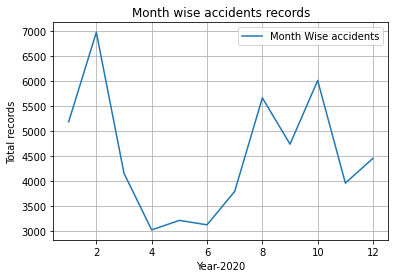

In [0]:
dfm = dfm.toPandas()
fig, ax = plt.subplots()
ax.plot(dfm['dmonth'], dfm['count'], label='Month Wise accidents')
ax.set(xlabel='Year-2020', ylabel='Total records',
       title='Month wise accidents records')
ax.grid(which='both', axis='both')
ax.legend()

- From the above visualization we can notice that, the more number of accidents taken place in second month.
- The curve gradually falls after the spring and in summer the count is less.
- We can analyse that in spring there are more accidents took place due to the rain, ice and fog.

In [0]:
# Finding crash count for every hour
only_hrs = final_crashes.select("ACC_TIME", hour(col("ACC_TIME")).alias("dhour"))
hrs_count = only_hrs.groupby('dhour').count()
hrs_count = hrs_count.orderBy('dhour', ascending=True)

#### Plotting the Accidents during day based on hours.

Out[28]: <matplotlib.legend.Legend at 0x7f66a906c250>

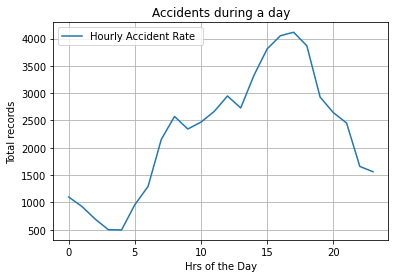

In [0]:
hrs_count = hrs_count.toPandas()
fig, ax = plt.subplots()
ax.plot(hrs_count['dhour'], hrs_count['count'], label='Hourly Accident Rate ')
ax.set(xlabel='Hrs of the Day', ylabel='Total records',
       title='Accidents during a day')
ax.grid(which='both', axis='both')
ax.legend()

- The above visualization we can notice that, the more number of accidents happens in between the hours from 15 to 20.
- We can analyse that the count of accidents is more at night due to the less visibility the distance is hard to judge at night times.

In [0]:
final_crashes=final_crashes.withColumn('Day', F.date_format('ACC_DATE', 'EEEE'))
display(final_crashes)

REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC,Day
AA00730012,2020-05-08T00:00:00.000+0000,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Male,MD,1998-11-22T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,HYUN,25,Yes,Accelerating,2,Passenger Car,Friday
AA0106001V,2020-01-22T00:00:00.000+0000,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,1993-03-08T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,FORD,25,No,Backing,11,Police Vehicle/Emergency,Wednesday
AA0106001V,2020-01-22T00:00:00.000+0000,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,1993-03-08T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2013,CHEV,25,No,Slowing or Stopping,3,Police Vehicle/Emergency,Wednesday
AA0106001V,2020-01-22T00:00:00.000+0000,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,1997-10-17T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,FORD,25,No,Backing,11,Police Vehicle/Emergency,Wednesday
AA0106001V,2020-01-22T00:00:00.000+0000,06:00:00,Not Applicable,Property Damage Crash,Harford,39.51105,-76.16844,2020,Same Direction Rear End,Dry,Not Applicable,Not Applicable,Dark Lights On,Male,MD,1997-10-17T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2013,CHEV,25,No,Slowing or Stopping,3,Police Vehicle/Emergency,Wednesday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday
AA0142000S,2020-06-02T00:00:00.000+0000,13:00:00,Not Applicable,Property Damage Crash,Harford,39.513878,-76.175644,2020,Same Direction Rear End,Dry,"Two-way, Not Divided",Not Applicable,Daylight,Female,MD,1965-06-07T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2012,CHEVY,25,No,Stopped in Traffic Lane,6,Passenger Car,Tuesday


In [0]:
# Finding the day wise count of accidents
day_count=final_crashes.select("Day") \
                                  .groupBy("Day").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
display(day_count)

Day,count
Thursday,10428
Friday,10264
Monday,7690
Wednesday,7191
Tuesday,6828
Saturday,6689
Sunday,5181


#### Plotting the day wise count of accidents.

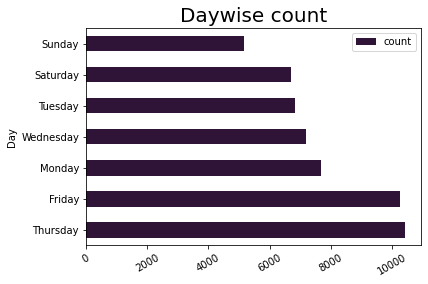

In [0]:
day_count.plot(kind='barh', x='Day', y='count', colormap='twilight_shifted')
plt.title("Daywise count", fontdict = {'fontsize': 20,  'color': '#000000'})
plt.xticks(rotation=30)
plt.show()

- From above figure we can analyse the count is more during Thursday's and Friday's.
- We can notice during the working days there is huge traffic and chances of having crashes are also high.

In [0]:
# Analysing the weather column.

final_crashes.select('WEATHER_DESC').distinct().rdd.map(lambda r: r[0]).collect()

Out[32]: ['Foggy',
 'Wintry Mix',
 'Blowing Snow',
 'Raining',
 'Unknown',
 'Other',
 'Not Applicable',
 'Severe Winds']

In [0]:
# Remove rows with null, Unknown
final_crashes=final_crashes.where((final_crashes.WEATHER_DESC != 'Not Applicable') \
                                  & (final_crashes.WEATHER_DESC != 'Unknown') \
                                  & (final_crashes.WEATHER_DESC != 'Other') \
                                  & (final_crashes.WEATHER_DESC != 'null'))
final_crashes.select('WEATHER_DESC').distinct().show()

+------------+
|WEATHER_DESC|
+------------+
|       Foggy|
|  Wintry Mix|
|Blowing Snow|
|     Raining|
|Severe Winds|
+------------+



In [0]:
# Frequency of weather descriptions

weather_freq = final_crashes.select("WEATHER_DESC") \
                                  .groupBy("WEATHER_DESC").count() \
                                  .orderBy("count", ascending=True) \
                                  .toPandas()
                                    
display(weather_freq)

WEATHER_DESC,count
Blowing Snow,65
Severe Winds,218
Wintry Mix,359
Foggy,1205
Raining,32106


#### Plotting the Accidents based on weather description column.

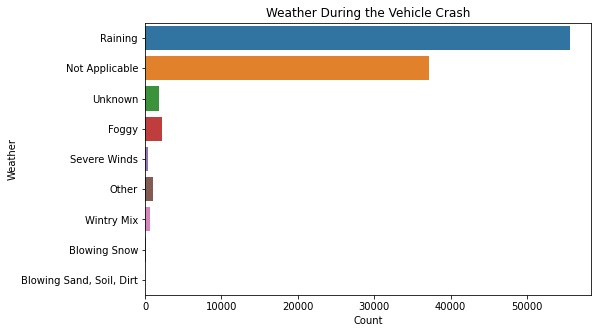

In [0]:
plt.figure(figsize=(8,5))
sns.countplot(y = filter_2020['WEATHER_DESC'])
plt.title('Weather During the Vehicle Crash')
plt.xlabel('Count')
plt.ylabel('Weather')
plt.show()

- In rainy days the count is more due to the roads are wet and there are high chances to get skid.

In [0]:
#Analysing county description

final_crashes.select('COUNTY_DESC').distinct().show()

+---------------+
|    COUNTY_DESC|
+---------------+
|      Worcester|
|Prince George's|
|     Montgomery|
|   Anne Arundel|
|       Allegany|
|     Washington|
|         Talbot|
|        Charles|
|        Harford|
|       Somerset|
|     Dorchester|
|     St. Mary's|
|           Kent|
|      Frederick|
|       Wicomico|
|        Carroll|
| Baltimore City|
|          Cecil|
|      Baltimore|
|       Caroline|
+---------------+
only showing top 20 rows



In [0]:
freq = final_crashes.select("COUNTY_DESC") \
                                  .groupBy("COUNTY_DESC").count() \
                                  .orderBy("count", ascending=True) \
                                  .toPandas()
                                    
display(freq)

COUNTY_DESC,count
Kent,36
Somerset,99
Garrett,106
Dorchester,145
Caroline,172
Queen Anne's,197
Talbot,215
Allegany,246
Worcester,277
Calvert,306


#### Plotting the top 10 countys involved in accidents.

In [0]:
freq = freq.tail(10)
display(freq)

COUNTY_DESC,count
Washington,819
Frederick,819
Charles,1116
Howard,1290
Harford,1331
Anne Arundel,3341
Montgomery,4186
Baltimore,5425
Prince George's,5725
Baltimore City,5815


- The county's with highest population has more numner of accidents.
- We can notice Baltomore City and County had more number of accidents.
- Followed by Prince George's had more number of accidents.
- Washington has least number of accidents.

In [0]:
# Analysing VEH_MAKE

final_crashes.select('VEH_MAKE').distinct().rdd.map(lambda r: r[0]).collect()

Out[39]: ['19UDE2F83GA010099',
 'SANDPIPER',
 'SILVERADO',
 'DODG',
 'ACURA',
 'KI',
 'EONE',
 'GILLIC',
 '2A8HR44E99R529058',
 'POTIAC',
 'CHYSLER',
 'MERCEDES',
 'PIERCE',
 'TOY',
 'MERCUR',
 'FREIGHTLINER',
 'FRT',
 'LINC',
 'INTER',
 'HYUNDAI',
 'MERZ',
 'INTERNATIONAL',
 'INFINTY',
 'LEX',
 'FIAT',
 'FREIGHT',
 'INIFINITI',
 'GILLIG',
 'GILL',
 'CHRY',
 'TOYOTA',
 'PORS',
 '1HGCM56445A100422',
 'USU',
 'RAM',
 'NDA',
 'SUBARU',
 'NISSAN',
 'BUICL',
 'POLARIS',
 'NOVB',
 'VOLK WAGON',
 'HONA',
 'SUZUKI',
 'INFINITI',
 'HINO',
 'LEXS',
 'FORD',
 'AUDI',
 'VOLV',
 'STRN',
 'INTERNATION',
 '1HGCR2F36EA280705',
 'ISUZU',
 'OLDSMOBILE',
 'MINI',
 'SAAB',
 'IHC',
 'JN1CV6AR7AM250105',
 'CHRYS',
 'MERC',
 'DODGE',
 'FRHT',
 'CHEVROLET',
 'NEWFLYER',
 'HYUNDIA',
 'HYUN',
 'SUBA',
 'MUSTANG',
 'BUIC',
 'BOAD',
 'MITS',
 'MERCURY',
 'BMI',
 'LEXUS',
 'ACUR',
 'INTL',
 'CHRYLSER',
 'JEEP',
 'VOLVO',
 'WABASH',
 '3KPA24AD2LE296299',
 'R&R',
 'INFI',
 'TESLA',
 'MERCEDEZ',
 'SPARTAN',
 'HOND',


In [0]:
make_freq = final_crashes.select("VEH_MAKE") \
                                  .groupBy("VEH_MAKE").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(make_freq)

VEH_MAKE,count
FORD,4148
TOYOTA,3630
HONDA,3556
NISSAN,2385
DODGE,1323
CHEVY,1286
HYUNDAI,1229
CHEVROLET,1202
JEEP,1021
TOYT,951


#### Plotting the top 10 vehicle types that were involved in accidents.

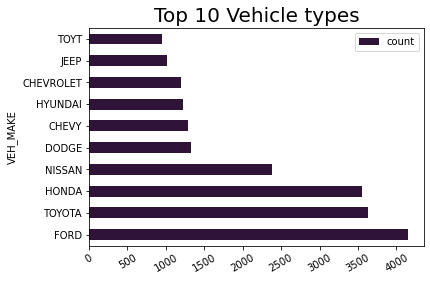

In [0]:
make_freq=make_freq.head(10)
make_freq.plot(kind='barh', x='VEH_MAKE', y='count', colormap='twilight_shifted')
plt.title("Top 10 Vehicle types", fontdict = {'fontsize': 20,  'color': '#000000'})
plt.xticks(rotation=30)
plt.show()

In [0]:
# Analysing SEX_DESC

final_crashes.select('SEX_DESC').distinct().show()

+--------+
|SEX_DESC|
+--------+
|  Female|
| Unknown|
|    Male|
+--------+



In [0]:
# Remove rows with null, Unknown
final_crashes=final_crashes.where(final_crashes.SEX_DESC != 'Unknown')
final_crashes.select('SEX_DESC').distinct().show()

+--------+
|SEX_DESC|
+--------+
|  Female|
|    Male|
+--------+



#### Plotting the Gender type who were involve in the accidents.

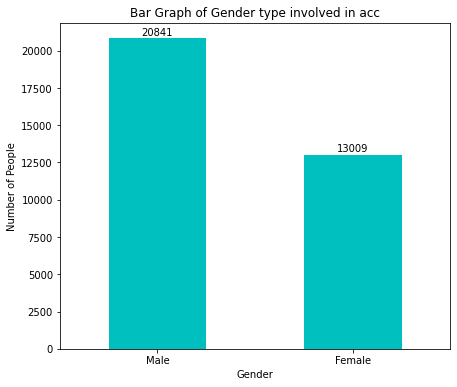

In [0]:
gender = final_crashes.toPandas()['SEX_DESC'].value_counts()
plt.figure(figsize=(7, 6))
ax = gender.plot(kind='bar', rot=0, color="c")
ax.set_title("Bar Graph of Gender type involved in acc", y = 1)
ax.set_xlabel('Gender')
ax.set_ylabel('Number of People')
ax.set_xticklabels(('Male', 'Female'))

for rect in ax.patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = format(y_value)
    ax.annotate(label, (x_value, y_value), xytext=(0, space), textcoords="offset points", ha='center', va='bottom')    
plt.show()

- From the above figure we can notice gender type 'Male' has involved in more crashes with a count 20k plus.
- Whereas Females are less with a count od 13k plus.

#### For each county determining the average age of the drivers who were involved in these accidents.

In [0]:
new_df=final_crashes.withColumn('AGE',  
         floor(datediff(current_date(), to_date(col('DATE_OF_BIRTH'), 'M/d/yyyy'))/365.25))
x=new_df.groupBy("COUNTY_DESC").agg(avg("AGE"))
display(x)

COUNTY_DESC,avg(AGE)
Worcester,39.624548736462096
Prince George's,39.80526777875329
Calvert,41.54248366013072
Queen Anne's,40.82233502538071
Montgomery,42.28995926192188
Anne Arundel,40.925382079712314
Allegany,41.1275720164609
Washington,42.731617647058826
Talbot,47.0046511627907
Charles,39.37724014336918


#### Determining the average age of the car companies involved in these accidents for each "vehicle make".  <br>

In [0]:
new_df=final_crashes.withColumn('VEH_AGE', 2022-col('VEH_YEAR'))
new_df.groupBy("VEH_MAKE").agg(avg("VEH_AGE")).show()

+-----------------+------------------+
|         VEH_MAKE|      avg(VEH_AGE)|
+-----------------+------------------+
|19UDE2F83GA010099|               6.0|
|        SANDPIPER|              20.0|
|        SILVERADO|               8.0|
|             DODG|12.564971751412429|
|            ACURA|13.389891696750903|
|               KI|              12.0|
|             EONE| 8.666666666666666|
|           GILLIC|              14.0|
|2A8HR44E99R529058|              13.0|
|           POTIAC|              20.0|
|          CHYSLER|11.666666666666666|
|         MERCEDES| 37.20175438596491|
|           PIERCE| 9.166666666666666|
|              TOY|11.466666666666667|
|           MERCUR|              14.0|
|     FREIGHTLINER|              11.0|
|              FRT| 8.176470588235293|
|             LINC|              15.8|
|            INTER| 8.444444444444445|
|          HYUNDAI|11.381107491856678|
+-----------------+------------------+
only showing top 20 rows



In [0]:
make_speed_freq=new_df.groupBy("VEH_MAKE").agg(avg("SPEED_LIMIT")).orderBy("avg(SPEED_LIMIT)", ascending=False) \
                                  .toPandas()
display(make_speed_freq)

VEH_MAKE,avg(SPEED_LIMIT)
PETER,70.0
JN1CV6AR7AM250105,65.0
HAUNDAI,65.0
VANH,65.0
ALDI,65.0
NSSAN,65.0
SPNR,65.0
VOL WAGON,65.0
TRK,65.0
CHEVY CRUZ,65.0


- In this graph we can notice that PETER vehicle make has involved in more number of crashes with average speed limit of 60% plus.
- Whereas NISSAN vehicle make has least number with 10% .

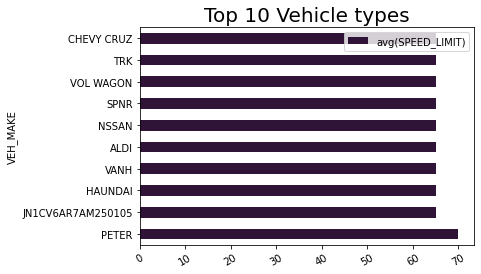

In [0]:
make_speed_freq=make_speed_freq.head(10)
make_speed_freq.plot(kind='barh', x='VEH_MAKE', y='avg(SPEED_LIMIT)', colormap='twilight_shifted')
plt.title("Top 10 Vehicle types", fontdict = {'fontsize': 20,  'color': '#000000'})
plt.xticks(rotation=30)
plt.show()

In [0]:
display(new_df)

REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC,Day,VEH_AGE
AA00730012,2020-05-08T00:00:00.000+0000,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Male,MD,1998-11-22T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,HYUN,25,Yes,Accelerating,2,Passenger Car,Friday,5
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday,9
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday,5
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday,9
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday,5
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Male,MD,1994-06-04T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2005,SATURN,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday,17
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Male,MD,1994-06-04T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2019,TOYOTA,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday,3
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Female,MD,2002-03-09T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2005,SATURN,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday,17
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Female,MD,2002-03-09T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2019,TOYOTA,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday,3
AB451800Y4,2020-05-22T00:00:00.000+0000,12:22:00,Raining,Injury Crash,Anne Arundel,38.97316,-76.52462,2020,Same Direction Rear End,Wet,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Female,MD,1980-03-11T00:00:00.000+0000,Non-incapacitating Injury,Driver,Apparently Normal,2017,FORD,30,No,Slowing or Stopping,3,"Other Light Trucks (10,000 lbs (4,536 kg))",Friday,5


In [0]:
mv_freq = final_crashes.select("MOVEMENT_DESC") \
                                  .groupBy("MOVEMENT_DESC").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(mv_freq)

MOVEMENT_DESC,count
Moving Constant Speed,15982
Slowing or Stopping,5430
Stopped in Traffic Lane,2907
Making Left Turn,2209
Accelerating,1883
Parked,1239
Changing Lanes,676
Making Right Turn,627
Skidding,564
Starting From Lane,528


- Here we can notice that more number of accidents took place at, when vehicle is moving at constant speed.

In [0]:
final_crashes.groupBy("MOVEMENT_DESC").agg(avg("SPEED_LIMIT")).show()

+--------------------+------------------+
|       MOVEMENT_DESC|  avg(SPEED_LIMIT)|
+--------------------+------------------+
|             Parking|              21.8|
|   Right Turn on Red|              32.5|
| Negotiating a Curve| 40.69965870307167|
|             Passing| 32.42424242424242|
|       Making U Turn| 37.17032967032967|
|Entering Traffic ...|34.492753623188406|
|Starting From Parked|28.135593220338983|
|             Unknown|  33.0377358490566|
|             Backing| 25.04237288135593|
|            Skidding| 47.34929078014184|
|               Other|  33.3739837398374|
|    Making Left Turn|34.255319148936174|
|        Accelerating| 33.87944768985661|
|Stopped in Traffi...| 35.01203990368077|
|  Starting From Lane| 33.88257575757576|
|Leaving Traffic Lane|              50.0|
|Moving Constant S...|40.838443248654734|
|      Changing Lanes| 47.47781065088758|
|      Not Applicable|28.762886597938145|
| Slowing or Stopping| 41.83425414364641|
+--------------------+------------

In [0]:
# Analysing PERSON_TYPE_DESC column
person_types = final_crashes.select("PERSON_TYPE_DESC") \
                                  .groupBy("PERSON_TYPE_DESC").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(person_types)

PERSON_TYPE_DESC,count
Driver,33750
Pedestrian,100


In [0]:
#Analysing INJ_SEVER_DESC column

injury = final_crashes.select("INJ_SEVER_DESC") \
                                  .groupBy("INJ_SEVER_DESC").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(injury)

INJ_SEVER_DESC,count
No Injury,27978
Non-incapacitating Injury,3557
Possible Incapacitating Injury,1988
Incapacitating/Disabled Injury,263
Fatal Injury,64


- More crashes are with No Injury and Non-Incapacitating(Low severity)
- Fatal Injuries and Incapatitating/Disabled are less(High severity)
- Possible Incapacitating are average(Medium severity)

In [0]:
final_crashes=final_crashes.where((final_crashes.RD_DIV_DESC != 'Not Applicable') \
                                  & (final_crashes.RD_DIV_DESC != 'Unknown') \
                                  & (final_crashes.RD_DIV_DESC != 'Other') \
                                  & (final_crashes.RD_DIV_DESC != 'null'))
RD_DIV_DESC = final_crashes.select("RD_DIV_DESC") \
                                  .groupBy("RD_DIV_DESC").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(RD_DIV_DESC)

RD_DIV_DESC,count
"Two-way, Divided, Positive Median Barrier",14508
"Two-way, Not Divided",11169
"Two-way, Divided, Unprotected (painted >4 feet) Median",4229
One-way Trafficway,2556


In [0]:
display(RD_DIV_DESC)

RD_DIV_DESC,count
"Two-way, Divided, Positive Median Barrier",14508
"Two-way, Not Divided",11169
"Two-way, Divided, Unprotected (painted >4 feet) Median",4229
One-way Trafficway,2556


- Here we can notice that more number of crashes involved when the road is two way, divided or positive median.
- In one way traffic there are few because there will be constant speed limits.

In [0]:
final_crashes=final_crashes.where((final_crashes.SURF_COND_DESC != 'Not Applicable') \
                                  & (final_crashes.SURF_COND_DESC != 'Unknown') \
                                  & (final_crashes.SURF_COND_DESC != 'Other') \
                                  & (final_crashes.SURF_COND_DESC != 'null'))
SURF_COND_DESC = final_crashes.select("SURF_COND_DESC") \
                                  .groupBy("SURF_COND_DESC").count() \
                                  .orderBy("count", ascending=False) \
                                  .toPandas()
                                    
display(SURF_COND_DESC)

SURF_COND_DESC,count
Wet,31221
Dry,639
Ice,172
Snow,119


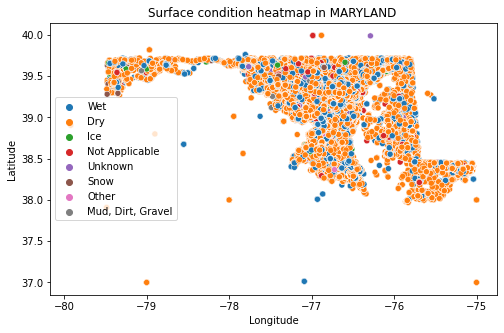

In [0]:
plt.figure(figsize=(8,5))
sns.scatterplot(y = filter_2020.LATITUDE, x = filter_2020.LONGITUDE, hue = filter_2020['SURF_COND_DESC'])
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Surface condition heatmap in MARYLAND ")
plt.legend(loc = "best")
plt.show()

- More crashes occured on wet road

In [0]:
display(final_crashes)

REPORT_NO,ACC_DATE,ACC_TIME,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,LATITUDE,LONGITUDE,YEAR,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,LIGHT_DESC,SEX_DESC,LICENSE_STATE_CODE,DATE_OF_BIRTH,INJ_SEVER_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_YEAR,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,MOVEMENT_CODE,BODY_TYPE_DESC,Day
AA00730012,2020-05-08T00:00:00.000+0000,18:29:00,Raining,Property Damage Crash,Harford,39.510677,-76.155685,2020,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Daylight,Male,MD,1998-11-22T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,HYUN,25,Yes,Accelerating,2,Passenger Car,Friday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1977-07-02T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2013,DODGE,50,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA01410021,2020-10-29T00:00:00.000+0000,05:06:00,Raining,Injury Crash,Harford,39.51879,-76.15206,2020,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Dark No Lights,Male,MD,1994-07-22T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2017,PETERBILT,50,No,Moving Constant Speed,1,Passenger Car,Thursday
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Male,MD,1994-06-04T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2005,SATURN,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Male,MD,1994-06-04T00:00:00.000+0000,No Injury,Driver,Apparently Normal,2019,TOYOTA,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Female,MD,2002-03-09T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2005,SATURN,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AA0143001R,2020-12-24T00:00:00.000+0000,17:50:00,Raining,Injury Crash,Harford,39.513344,-76.17461,2020,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Dark Lights On,Female,MD,2002-03-09T00:00:00.000+0000,Possible Incapacitating Injury,Driver,Apparently Normal,2019,TOYOTA,30,Yes,Moving Constant Speed,1,Passenger Car,Thursday
AB451800Y4,2020-05-22T00:00:00.000+0000,12:22:00,Raining,Injury Crash,Anne Arundel,38.97316,-76.52462,2020,Same Direction Rear End,Wet,"Two-way, Divided, Positive Median Barrier",Not Applicable,Daylight,Female,MD,1980-03-11T00:00:00.000+0000,Non-incapacitating Injury,Driver,Apparently Normal,2017,FORD,30,No,Slowing or Stopping,3,"Other Light Trucks (10,000 lbs (4,536 kg))",Friday


#### Collision Type During the Accident

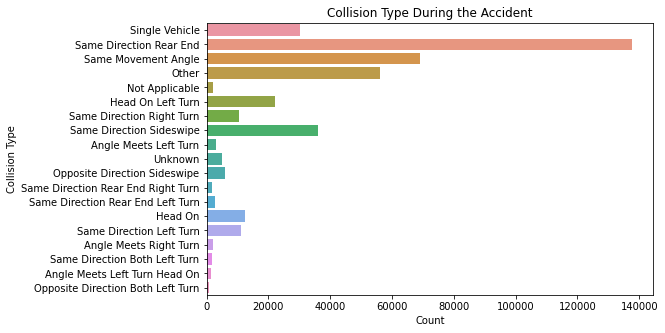

In [0]:

plt.figure(figsize=(8,5))
sns.countplot(y = filter_2020['COLLISION_TYPE_DESC'])
plt.title('Collision Type During the Accident')
plt.xlabel('Count')
plt.ylabel('Collision Type')
plt.show()

- Most crashes happened in Same Direction Rare End

#### Vehicle Type which undergo most accidents

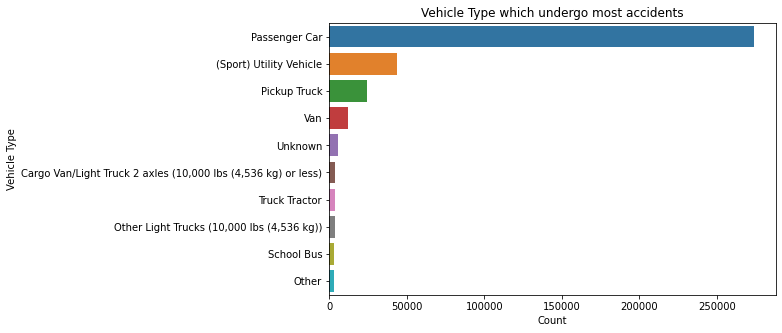

In [0]:
plt.figure(figsize=(8,5))
sns.countplot(y = filter_2020['BODY_TYPE_DESC'], order = filter_2020['BODY_TYPE_DESC'].value_counts().index[:10])
plt.title('Vehicle Type which undergo most accidents')
plt.xlabel('Count')
plt.ylabel('Vehicle Type')
plt.show()

- Passenger Cars were involved in the majority of collisions.

#### Light type during the accidents- heatmap in MARYLAND

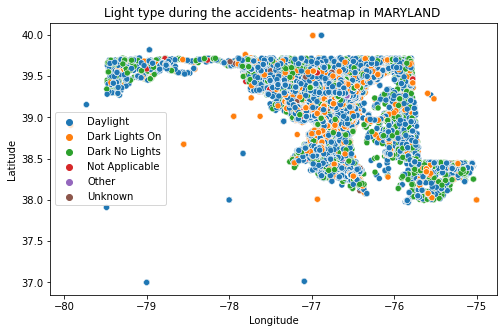

In [0]:
plt.figure(figsize=(8,5))
sns.scatterplot(y = filter_2020.LATITUDE, x = filter_2020.LONGITUDE, hue = filter_2020['LIGHT_DESC'])
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Light type during the accidents- heatmap in MARYLAND ")
plt.legend(loc = "best")
plt.show()

### Does the Driving speed affect  Vehicle Crashes?

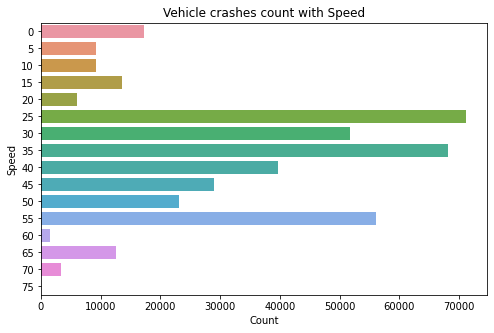

In [0]:
plt.figure(figsize=(8,5))
sns.countplot(y = filter_2020['SPEED_LIMIT'])
plt.title('Vehicle crashes count with Speed')
plt.xlabel('Count')
plt.ylabel('Speed')
plt.show()

## Model Building

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import DecisionTreeClassifier,RandomForestClassifier,GBTClassifier,LogisticRegression
from pyspark.ml.feature import StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator,BinaryClassificationEvaluator
from pyspark.mllib.util import MLUtils
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder, CrossValidatorModel

Selecting columns required for model building

In [0]:
df=final_crashes.select(['REPORT_NO',
 'WEATHER_DESC',
 'REPORT_TYPE',
 'COUNTY_DESC',
 'COLLISION_TYPE_DESC',
 'SURF_COND_DESC',
 'RD_DIV_DESC',
 'FIX_OBJ_DESC',
 'SEX_DESC',
 'PERSON_TYPE_DESC',
 'CONDITION_DESC',
 'VEH_MAKE',
 'SPEED_LIMIT',
 'TOWED_AWAY_FLAG_DESC',
 'MOVEMENT_DESC',
 'Day',
   'INJ_SEVER_DESC',])
cols = df.columns
df.printSchema()

root
 |-- REPORT_NO: string (nullable = true)
 |-- WEATHER_DESC: string (nullable = true)
 |-- REPORT_TYPE: string (nullable = true)
 |-- COUNTY_DESC: string (nullable = true)
 |-- COLLISION_TYPE_DESC: string (nullable = true)
 |-- SURF_COND_DESC: string (nullable = true)
 |-- RD_DIV_DESC: string (nullable = true)
 |-- FIX_OBJ_DESC: string (nullable = true)
 |-- SEX_DESC: string (nullable = true)
 |-- PERSON_TYPE_DESC: string (nullable = true)
 |-- CONDITION_DESC: string (nullable = true)
 |-- VEH_MAKE: string (nullable = true)
 |-- SPEED_LIMIT: integer (nullable = true)
 |-- TOWED_AWAY_FLAG_DESC: string (nullable = true)
 |-- MOVEMENT_DESC: string (nullable = true)
 |-- Day: string (nullable = true)
 |-- INJ_SEVER_DESC: string (nullable = true)



Converting INJ_SEVERE_DESC column into low, medium, high severity.

In [0]:
new_column = when((col("INJ_SEVER_DESC") == "No Injury"), 0 #Low
                 ).when((col("INJ_SEVER_DESC") == "Non-incapacitating Injury"),0 #Low
                 ).when((col("INJ_SEVER_DESC") == "Fatal Injury"),2 #High
                 ).when((col("INJ_SEVER_DESC") == "Incapacitating/Disabled Injury"),2 #High
                 ).when((col("INJ_SEVER_DESC") == "Possible Incapacitating Injury"),1) #Medium
df = df.withColumn("Severity_index", new_column)
df = df.drop('INJ_SEVER_DESC')
display(df)

REPORT_NO,WEATHER_DESC,REPORT_TYPE,COUNTY_DESC,COLLISION_TYPE_DESC,SURF_COND_DESC,RD_DIV_DESC,FIX_OBJ_DESC,SEX_DESC,PERSON_TYPE_DESC,CONDITION_DESC,VEH_MAKE,SPEED_LIMIT,TOWED_AWAY_FLAG_DESC,MOVEMENT_DESC,Day,Severity_index
AA00730012,Raining,Property Damage Crash,Harford,Single Vehicle,Wet,"Two-way, Divided, Positive Median Barrier",Curb,Male,Driver,Apparently Normal,HYUN,25,Yes,Accelerating,Friday,0
AA01410021,Raining,Injury Crash,Harford,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Male,Driver,Apparently Normal,DODGE,50,Yes,Moving Constant Speed,Thursday,0
AA01410021,Raining,Injury Crash,Harford,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Male,Driver,Apparently Normal,PETERBILT,50,No,Moving Constant Speed,Thursday,0
AA01410021,Raining,Injury Crash,Harford,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Male,Driver,Apparently Normal,DODGE,50,Yes,Moving Constant Speed,Thursday,1
AA01410021,Raining,Injury Crash,Harford,Same Direction Right Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Not Applicable,Male,Driver,Apparently Normal,PETERBILT,50,No,Moving Constant Speed,Thursday,1
AA0143001R,Raining,Injury Crash,Harford,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Male,Driver,Apparently Normal,SATURN,30,Yes,Moving Constant Speed,Thursday,0
AA0143001R,Raining,Injury Crash,Harford,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Male,Driver,Apparently Normal,TOYOTA,30,Yes,Moving Constant Speed,Thursday,0
AA0143001R,Raining,Injury Crash,Harford,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Female,Driver,Apparently Normal,SATURN,30,Yes,Moving Constant Speed,Thursday,1
AA0143001R,Raining,Injury Crash,Harford,Head On Left Turn,Wet,"Two-way, Divided, Unprotected (painted >4 feet) Median",Other Pole,Female,Driver,Apparently Normal,TOYOTA,30,Yes,Moving Constant Speed,Thursday,1
AB451800Y4,Raining,Injury Crash,Anne Arundel,Same Direction Rear End,Wet,"Two-way, Divided, Positive Median Barrier",Not Applicable,Female,Driver,Apparently Normal,FORD,30,No,Slowing or Stopping,Friday,0


Randomly split data into train and test sets, and set seed for reproducibility.

In [0]:
train, test = df.randomSplit([.8, .2], seed=42)
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 25879
Test Dataset Count: 6272


### Preparing Data for Machine Learning
The process includes:
  - Category Indexing, 
  - Vector Assembler — a feature transformer that merges multiple columns into a vector column.

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StringIndexer

categoricalCols = [field for (field, dataType) in train.dtypes if dataType == "string"]
indexOutputCols = [x + "Index" for x in categoricalCols]

stringIndexer = StringIndexer(inputCols=categoricalCols, outputCols=indexOutputCols, handleInvalid="skip")
numericCols = [field for (field, dataType) in train.dtypes 
               if ((dataType == "double") & (field != "Severity_index"))]

assemblerInputs = indexOutputCols + numericCols
vecAssembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")

### Decision Tree

Decision trees are widely used since they are easy to interpret, handle categorical features, extend to the multiclass classification setting, while not requiring feature scaling and are able to capture non-linearities and feature interactions.

In [0]:
from pyspark.ml.classification import DecisionTreeClassifier

dt = DecisionTreeClassifier(labelCol="Severity_index",maxBins=30000)

- Pipeline is used to specify our machine learning workflow by chaining together multiple Transformers and Estimators. The stages of a pipeline are specified as an ordered array.

In [0]:
from pyspark.ml import Pipeline

# Combine stages into pipeline
stages = [stringIndexer, vecAssembler, dt]
pipeline = Pipeline(stages=stages)

pipelineModel = pipeline.fit(train)

Make predictions on the test set.

In [0]:
predDF = pipelineModel.transform(test)

predDF.show(5)

+----------+------------+------------+------------+--------------------+--------------+--------------------+--------------+--------+----------------+-----------------+---------+-----------+--------------------+--------------------+--------+--------------+--------------+-----------------+----------------+----------------+------------------------+-------------------+----------------+-----------------+-------------+---------------------+-------------------+-------------+-------------------------+------------------+--------+--------------------+-------------------+--------------------+----------+
| REPORT_NO|WEATHER_DESC| REPORT_TYPE| COUNTY_DESC| COLLISION_TYPE_DESC|SURF_COND_DESC|         RD_DIV_DESC|  FIX_OBJ_DESC|SEX_DESC|PERSON_TYPE_DESC|   CONDITION_DESC| VEH_MAKE|SPEED_LIMIT|TOWED_AWAY_FLAG_DESC|       MOVEMENT_DESC|     Day|Severity_index|REPORT_NOIndex|WEATHER_DESCIndex|REPORT_TYPEIndex|COUNTY_DESCIndex|COLLISION_TYPE_DESCIndex|SURF_COND_DESCIndex|RD_DIV_DESCIndex|FIX_OBJ_DESCInde

In [0]:
acc_dt=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="accuracy").evaluate(predDF)
print("Accuracy for Decision Tree ",acc_dt)

Accuracy for Decision Tree  0.9322837632776935


In [0]:
precision_dt=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedPrecision").evaluate(predDF)
print("Precision for Decision Tree ",precision_dt)

Precision for Decision Tree  0.9144131347213047


In [0]:
recall_dt=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedRecall").evaluate(predDF)
print("Recall for Decision Tree ",recall_dt)

Recall for Decision Tree  0.9322837632776935


- Accuracy for Decision Tree  0.9322837632776935
- Precision for Decision Tree  0.9144131347213047
- Recall for Decision Tree  0.9322837632776935

### Random Forest
Random forest is a supervised learning algorithm that can be used for classification as well as regression. However, it is primarily used to solve classification issues. In the same way that a forest is made up of trees, and more trees mean more robust forests, the random forest algorithm creates decision trees on data samples, gets predictions from each of them, and then votes on the best solution. It is an ensemble method that is superior to a single decision tree because it averages the results to reduce over-fitting.

In [0]:
rf=RandomForestClassifier(labelCol="Severity_index",numTrees=20, seed=42,maxBins=30000)

stages = [stringIndexer, vecAssembler, rf]
pipeline = Pipeline(stages=stages)

pipelineModel = pipeline.fit(train)

In [0]:
pred_rf = pipelineModel.transform(test)
pred_rf.show(5)

+----------+------------+------------+------------+--------------------+--------------+--------------------+--------------+--------+----------------+-----------------+---------+-----------+--------------------+--------------------+--------+--------------+--------------+-----------------+----------------+----------------+------------------------+-------------------+----------------+-----------------+-------------+---------------------+-------------------+-------------+-------------------------+------------------+--------+--------------------+--------------------+--------------------+----------+
| REPORT_NO|WEATHER_DESC| REPORT_TYPE| COUNTY_DESC| COLLISION_TYPE_DESC|SURF_COND_DESC|         RD_DIV_DESC|  FIX_OBJ_DESC|SEX_DESC|PERSON_TYPE_DESC|   CONDITION_DESC| VEH_MAKE|SPEED_LIMIT|TOWED_AWAY_FLAG_DESC|       MOVEMENT_DESC|     Day|Severity_index|REPORT_NOIndex|WEATHER_DESCIndex|REPORT_TYPEIndex|COUNTY_DESCIndex|COLLISION_TYPE_DESCIndex|SURF_COND_DESCIndex|RD_DIV_DESCIndex|FIX_OBJ_DESCInd

In [0]:
acc_rf=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="accuracy").evaluate(pred_rf)
print("Accuracy for Random Forest:",acc_rf)

Accuracy for Random Forest: 0.9296282245827011


In [0]:
precision_rf=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedPrecision").evaluate(pred_rf)
print("Precision for Random Forest:",precision_rf)

Precision for Random Forest: 0.864208635940785


In [0]:
recall_rf=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedRecall").evaluate(pred_rf)
print("Recall for Random Forest: ",recall_rf)

Recall for Random Forest:  0.9296282245827011


- Accuracy for Random Forest: 0.9296282245827011.
- Precision for Random Forest: 0.864208635940785.
- Recall for Random Forest: 0.9296282245827011.

### Logistic Regression

Logistic regression is the appropriate regression analysis to conduct when the dependent variable is dichotomous (binary). Like all regression analyses, logistic regression is a predictive analysis. Logistic regression is used to describe data and to explain the relationship between one dependent binary variable and one or more nominal, ordinal, interval or ratio-level independent variables. Logistic Regression is used when the dependent variable(target) is categorical.

In [0]:
lr=LogisticRegression(featuresCol="features", labelCol="Severity_index")

stages = [stringIndexer, vecAssembler, lr]
pipeline = Pipeline(stages=stages)

model_lr = pipeline.fit(train)

In [0]:
pred_lr = model_lr.transform(test)
pred_lr.show(5)

+----------+------------+------------+------------+--------------------+--------------+--------------------+--------------+--------+----------------+-----------------+---------+-----------+--------------------+--------------------+--------+--------------+--------------+-----------------+----------------+----------------+------------------------+-------------------+----------------+-----------------+-------------+---------------------+-------------------+-------------+-------------------------+------------------+--------+--------------------+--------------------+--------------------+----------+
| REPORT_NO|WEATHER_DESC| REPORT_TYPE| COUNTY_DESC| COLLISION_TYPE_DESC|SURF_COND_DESC|         RD_DIV_DESC|  FIX_OBJ_DESC|SEX_DESC|PERSON_TYPE_DESC|   CONDITION_DESC| VEH_MAKE|SPEED_LIMIT|TOWED_AWAY_FLAG_DESC|       MOVEMENT_DESC|     Day|Severity_index|REPORT_NOIndex|WEATHER_DESCIndex|REPORT_TYPEIndex|COUNTY_DESCIndex|COLLISION_TYPE_DESCIndex|SURF_COND_DESCIndex|RD_DIV_DESCIndex|FIX_OBJ_DESCInd

In [0]:
acc_lr=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="accuracy").evaluate(pred_lr)
print("Accuracy for Logistic Regression:",acc_lr)

Accuracy for Logistic Regression: 0.9290591805766313


In [0]:
precision_lr=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedPrecision").evaluate(pred_lr)
print("Precision for Logistic Regression:",precision_lr)

Precision for Logistic Regression: 0.8886911666637953


In [0]:
recall_lr=MulticlassClassificationEvaluator(labelCol="Severity_index",metricName="weightedRecall").evaluate(pred_lr)
print("Recall for Logistic Regression:",recall_lr)

Recall for Logistic Regression: 0.9290591805766313


- Accuracy for Logistic Regression: 0.9290591805766313
- Precision for Logistic Regression: 0.8886911666637953
- Recall for Logistic Regression: 0.9290591805766313

In [0]:
models=["Decision Tree", "Random Forest", "Logistic Regression"]

accuracy=[acc_dt,acc_rf,acc_lr]
precision=[precision_dt,precision_rf,precision_lr]
recall=[recall_dt,recall_rf,recall_lr]

results={'Models':models, 'Accuracy':accuracy, 'Precision':precision, 'Recall':recall}
res=pd.DataFrame(results)
res.head()

,Models,Accuracy,Precision,Recall
0,Decision Tree,0.932284,0.914413,0.932284
1,Random Forest,0.929628,0.864209,0.929628
2,Logistic Regression,0.929059,0.888691,0.929059


- From the above observations we can notice that Decision Tree model stands with high accuracy of 93% and we can say that it is good fit.
- Followed by Random Forest and Logistic Regression stands with 92%.